In [2]:
import os
import random
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau,
    ModelCheckpoint
)

from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

print("TensorFlow Version:", tf.__version__)

2026-05-26 05:05:52.406911: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1779771952.937812      83 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1779771953.047265      83 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1779771954.125021      83 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1779771954.125059      83 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1779771954.125062      83 computation_placer.cc:177] computation placer alr

TensorFlow Version: 2.19.0


In [3]:
print("GPU Available:", tf.config.list_physical_devices('GPU'))

GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]


In [32]:
import kagglehub

dataset_path = kagglehub.dataset_download("vencerlanz09/sea-animals-image-dataste")

print("Path to dataset files:", dataset_path)

Path to dataset files: /kaggle/input/datasets/vencerlanz09/sea-animals-image-dataste


In [5]:
image_paths = []
labels = []

for folder in os.listdir(dataset_path):

    folder_path = os.path.join(dataset_path, folder)

    if os.path.isdir(folder_path):

        for image in os.listdir(folder_path):

            image_path = os.path.join(folder_path, image)

            image_paths.append(image_path)
            labels.append(folder)

df = pd.DataFrame({
    "image": image_paths,
    "label": labels
})

print(df.head())
print("\nTotal Images:", len(df))

                                               image    label
0  /kaggle/input/datasets/vencerlanz09/sea-animal...  Penguin
1  /kaggle/input/datasets/vencerlanz09/sea-animal...  Penguin
2  /kaggle/input/datasets/vencerlanz09/sea-animal...  Penguin
3  /kaggle/input/datasets/vencerlanz09/sea-animal...  Penguin
4  /kaggle/input/datasets/vencerlanz09/sea-animal...  Penguin

Total Images: 13711


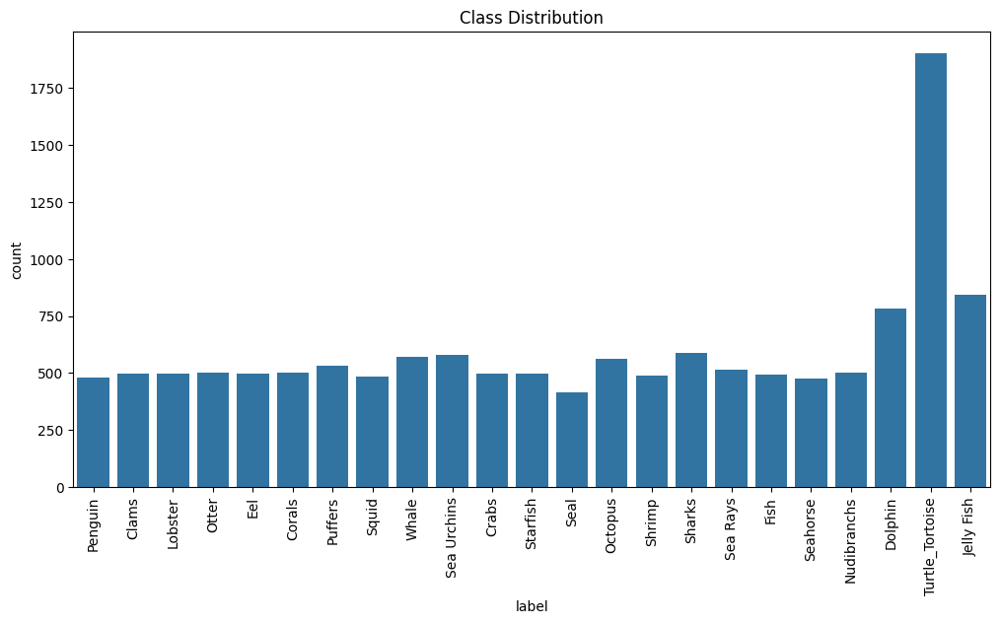

In [6]:
plt.figure(figsize=(12,6))

sns.countplot(x=df['label'])

plt.xticks(rotation=90)
plt.title("Class Distribution")
plt.show()

# DATA SPLITTING

In [7]:
encoder = LabelEncoder()

df['label_encoded'] = encoder.fit_transform(df['label'])

class_names = encoder.classes_

num_classes = len(class_names)

print("Number of Classes:", num_classes)

Number of Classes: 23


In [8]:
train_df, temp_df = train_test_split(
    df,
    test_size=0.3,
    stratify=df['label_encoded'],
    random_state=42
)

valid_df, test_df = train_test_split(
    temp_df,
    test_size=0.5,
    stratify=temp_df['label_encoded'],
    random_state=42
)

print("Train:", len(train_df))
print("Validation:", len(valid_df))
print("Test:", len(test_df))

Train: 9597
Validation: 2057
Test: 2057


In [9]:
IMG_SIZE = 256
BATCH_SIZE = 32
EPOCHS = 100
AUTOTUNE = tf.data.AUTOTUNE

In [10]:
def load_image(path, label):

    image = tf.io.read_file(path)

    image = tf.image.decode_jpeg(image, channels=3)

    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))

    image = tf.cast(image, tf.float32) / 255.0

    return image, label

In [11]:
data_augmentation = tf.keras.Sequential([

    layers.RandomFlip("horizontal"),

    layers.RandomRotation(0.05),

    layers.RandomZoom(0.1)

])

I0000 00:00:1779771992.879215      83 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13757 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1779771992.885608      83 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13757 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


In [12]:
train_ds = tf.data.Dataset.from_tensor_slices(
    (
        train_df['image'].values,
        train_df['label_encoded'].values
    )
)

valid_ds = tf.data.Dataset.from_tensor_slices(
    (
        valid_df['image'].values,
        valid_df['label_encoded'].values
    )
)

test_ds = tf.data.Dataset.from_tensor_slices(
    (
        test_df['image'].values,
        test_df['label_encoded'].values
    )
)

train_ds = (
    train_ds
    .map(load_image, num_parallel_calls=AUTOTUNE)
    .shuffle(1000)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

valid_ds = (
    valid_ds
    .map(load_image, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

test_ds = (
    test_ds
    .map(load_image, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

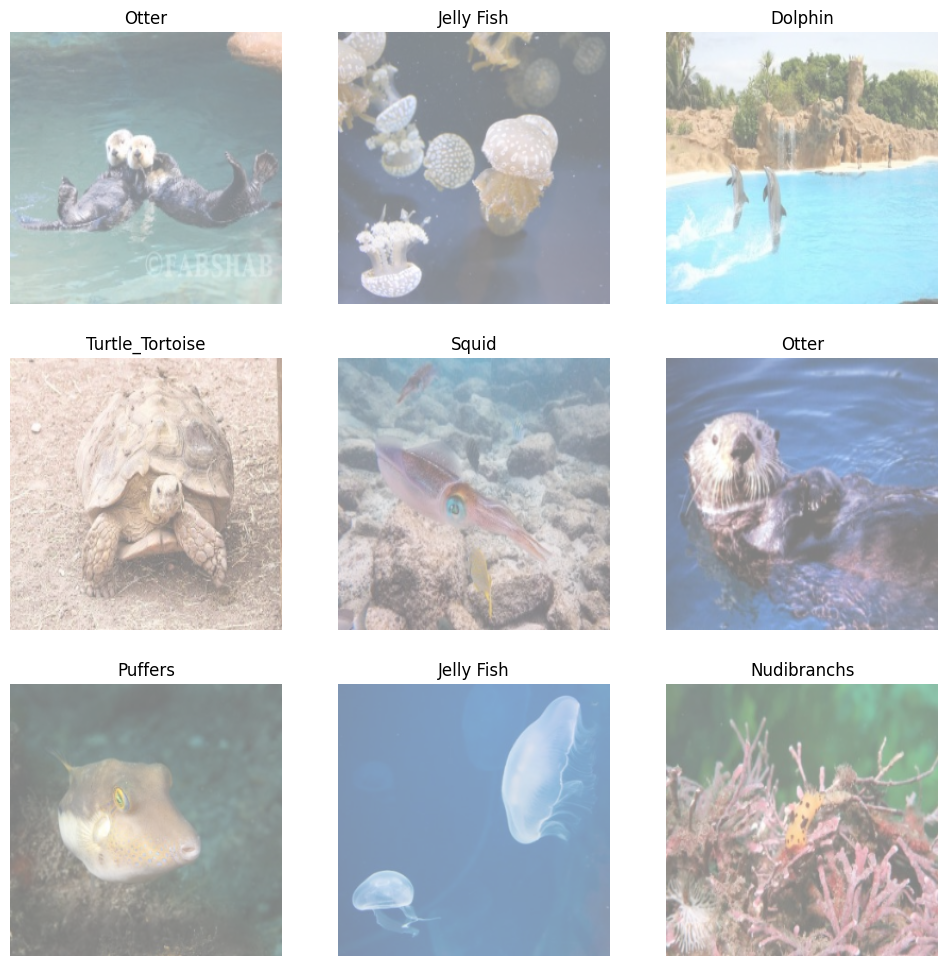

In [13]:
plt.figure(figsize=(12,12))

for images, labels in train_ds.take(1):

    for i in range(9):

        ax = plt.subplot(3,3,i+1)

        img = images[i].numpy()

        img = (img + 1) / 2

        plt.imshow(img)

        plt.title(class_names[labels[i]])

        plt.axis("off")

plt.show()

# MobilenetV2

In [146]:
base_model = MobileNetV2(
    weights='imagenet',
    include_top=False,
    input_shape=(IMG_SIZE, IMG_SIZE, 3)
)

base_model.trainable = False

for layer in base_model.layers[:-40]:
    layer.trainable = False

In [147]:
model = models.Sequential([

    data_augmentation,

    base_model,

    layers.GlobalAveragePooling2D(),

    layers.Dropout(0.3),

    layers.Dense(num_classes, activation='softmax')

])

model.summary()


model.compile(

    optimizer=tf.keras.optimizers.Adam(
        learning_rate=1e-4
    ),

    loss='sparse_categorical_crossentropy',

    metrics=['accuracy']
)

Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential_16 (Sequential)      │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 8, 8, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_10     │ ?                      │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_16 (Dropout)            │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 2,257,984 (8.61 MB)

In [148]:
os.makedirs("models", exist_ok=True)

callbacks = [

    EarlyStopping(
        patience=5,
        restore_best_weights=True
    ),

    ReduceLROnPlateau(
        patience=3,
        factor=0.2,
        verbose=1
    ),

    ModelCheckpoint(
        "models/mobilenetv2_best.keras",
        save_best_only=True,
        monitor='val_accuracy'
    )
]

In [149]:
from sklearn.utils.class_weight import compute_class_weight

class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_df['label_encoded']),
    y=train_df['label_encoded']
)

class_weights = dict(enumerate(class_weights))

print(class_weights)

{0: np.float64(1.199025487256372), 1: np.float64(1.1921739130434783), 2: np.float64(1.195589884141024), 3: np.float64(0.7628169461886972), 4: np.float64(1.199025487256372), 5: np.float64(1.2059562704197035), 6: np.float64(0.7048325499412456), 7: np.float64(1.195589884141024), 8: np.float64(1.1921739130434783), 9: np.float64(1.0617324925323597), 10: np.float64(1.1921739130434783), 11: np.float64(1.2381628177009418), 12: np.float64(1.1216690042075736), 13: np.float64(1.1526543358155177), 14: np.float64(1.0302737520128824), 15: np.float64(1.245554834523037), 16: np.float64(1.4388305847076461), 17: np.float64(1.0103168754605747), 18: np.float64(1.2200610221205186), 19: np.float64(1.2344996140982762), 20: np.float64(1.195589884141024), 21: np.float64(0.31325891108499804), 22: np.float64(1.0431521739130434)}


In [150]:
history = model.fit(

    train_ds,

    validation_data=valid_ds,

    epochs=EPOCHS,

    class_weight=class_weights
)

Epoch 1/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - accuracy: 0.1339 - loss: 3.0994 - val_accuracy: 0.5216 - val_loss: 1.9695
Epoch 2/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step - accuracy: 0.4433 - loss: 2.0837 - val_accuracy: 0.6417 - val_loss: 1.4523
Epoch 3/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step - accuracy: 0.5745 - loss: 1.6310 - val_accuracy: 0.6913 - val_loss: 1.2144
Epoch 4/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - accuracy: 0.6364 - loss: 1.3995 - val_accuracy: 0.7180 - val_loss: 1.0870
Epoch 5/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step - accuracy: 0.6602 - loss: 1.2721 - val_accuracy: 0.7346 - val_loss: 1.0049
Epoch 6/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step - accuracy: 0.6781 - loss: 1.1899 - val_accuracy: 0.7419 - val_loss: 0.9501
Epoch 7/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step - accuracy: 0.6992 - loss: 1.1178 - val_accuracy: 0.7506 - val_loss: 0.9063
Epoch 8/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - accuracy: 0.7094 - loss: 

In [151]:
model.save("models/mobilenetv2_final.keras")

print("Model Saved Successfully")

Model Saved Successfully


In [152]:
results = model.evaluate(test_ds)

print("\nTest Results")
print(results)

65/65 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.8025 - loss: 0.7306

Test Results
[0.6868095993995667, 0.8099173307418823]


In [153]:
y_true = []
y_pred = []

for images, labels in test_ds:

    preds = model.predict(images)

    preds = np.argmax(preds, axis=1)

    y_true.extend(labels.numpy())
    y_pred.extend(preds)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

In [154]:
accuracy = accuracy_score(y_true, y_pred)

precision = precision_score(
    y_true,
    y_pred,
    average='weighted'
)

recall = recall_score(
    y_true,
    y_pred,
    average='weighted'
)

f1 = f1_score(
    y_true,
    y_pred,
    average='weighted'
)

print("\nFINAL METRICS")

print("Accuracy :", accuracy)
print("Precision:", precision)
print("Recall   :", recall)
print("F1 Score :", f1)


FINAL METRICS
Accuracy : 0.8099173553719008
Precision: 0.816211664991955
Recall   : 0.8099173553719008
F1 Score : 0.8100479980145815


In [155]:
print(classification_report(
    y_true,
    y_pred,
    target_names=class_names
))

                 precision    recall  f1-score   support

          Clams       0.65      0.58      0.61        74
         Corals       0.58      0.80      0.67        75
          Crabs       0.97      0.97      0.97        75
        Dolphin       0.82      0.88      0.85       118
            Eel       0.61      0.72      0.66        74
           Fish       0.78      0.69      0.73        74
     Jelly Fish       0.96      0.94      0.95       127
        Lobster       0.77      0.83      0.79        75
    Nudibranchs       0.88      0.60      0.71        75
        Octopus       0.57      0.55      0.56        85
          Otter       1.00      1.00      1.00        75
        Penguin       0.81      0.83      0.82        72
        Puffers       0.85      0.75      0.79        80
       Sea Rays       0.63      0.78      0.70        78
    Sea Urchins       0.96      1.00      0.98        87
       Seahorse       0.80      0.73      0.76        71
           Seal       0.82    

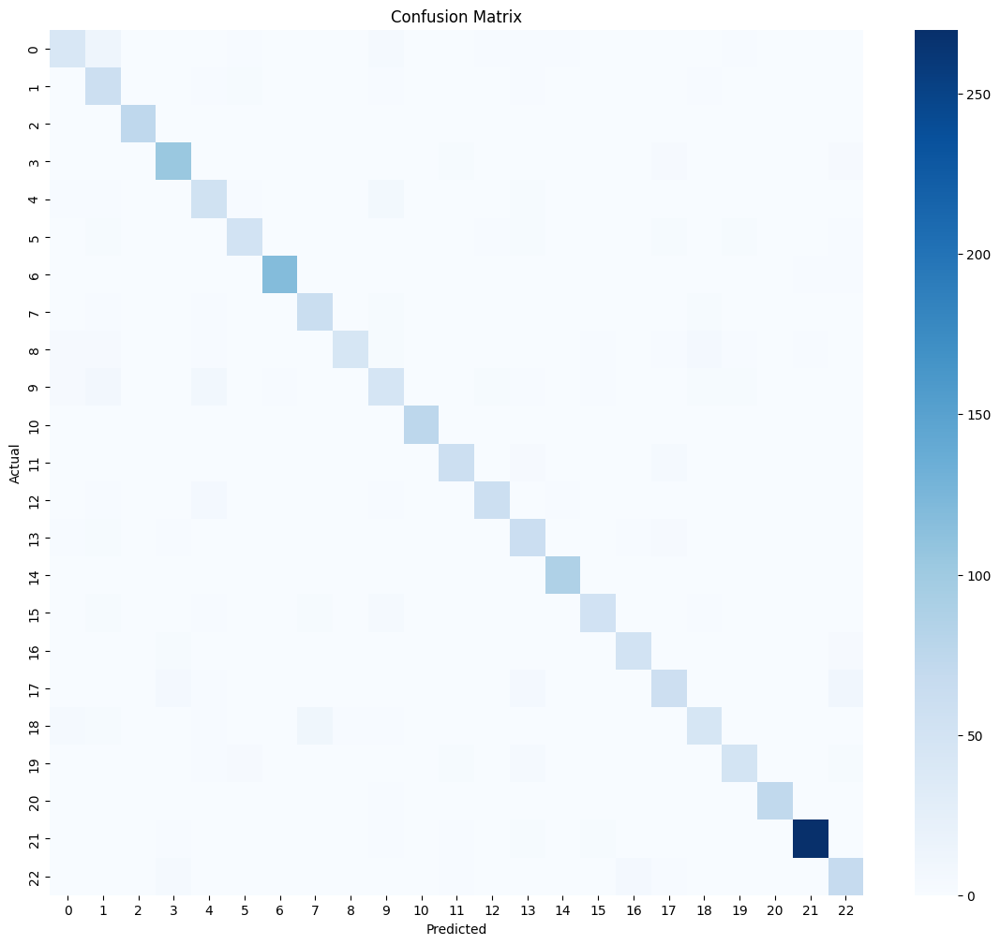

In [156]:
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(14,12))

sns.heatmap(
    cm,
    annot=False,
    cmap='Blues'
)

plt.title("Confusion Matrix")

plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.show()

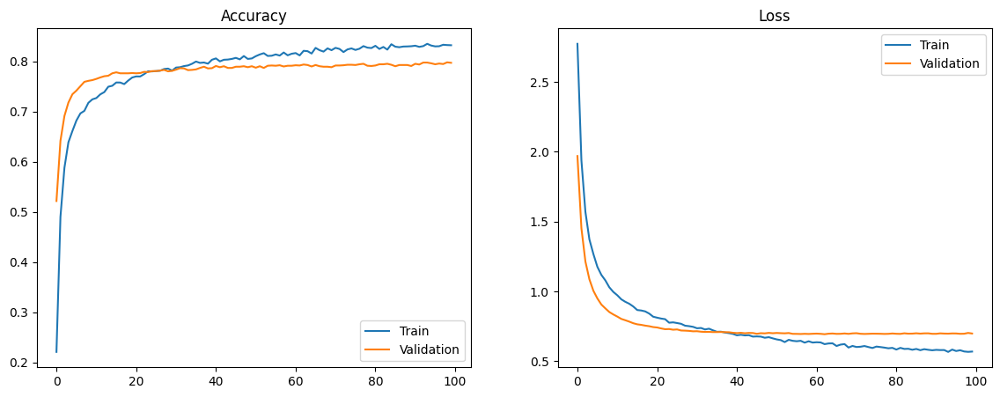

In [157]:
plt.figure(figsize=(14,5))

plt.subplot(1,2,1)

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])

plt.title("Accuracy")
plt.legend(['Train', 'Validation'])

plt.subplot(1,2,2)

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.title("Loss")
plt.legend(['Train', 'Validation'])

plt.show()

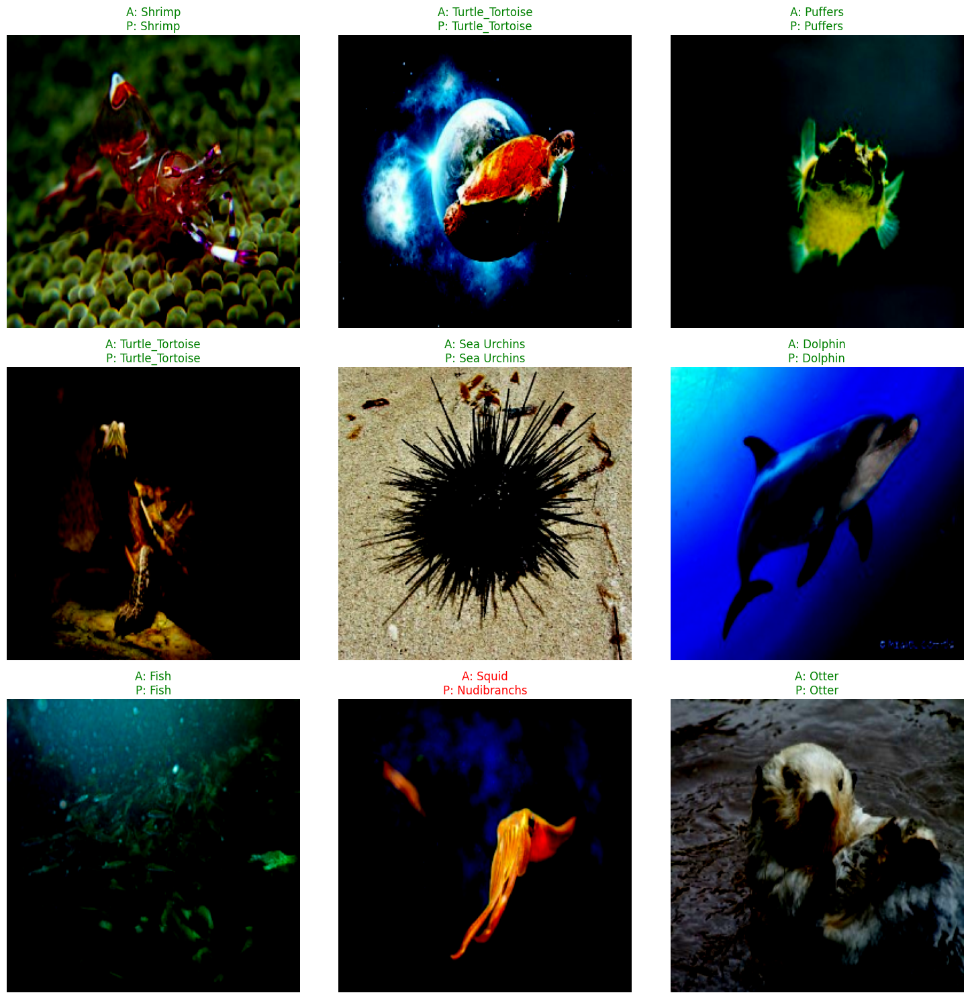

In [40]:
plt.figure(figsize=(15,15))

for images, labels in test_ds.shuffle(1000).take(1):

    preds = model.predict(images, verbose=0)

    preds = np.argmax(preds, axis=1)

    for i in range(9):

        ax = plt.subplot(3,3,i+1)

        img = images[i].numpy()

        img = np.clip(img, 0, 1)

        plt.imshow(img)

        actual = class_names[labels[i]]

        predicted = class_names[preds[i]]

        color = "green" if actual == predicted else "red"

        plt.title(
            f"A: {actual}\nP: {predicted}",
            color=color
        )

        plt.axis("off")

plt.tight_layout()

plt.savefig(
    "mobilenetv2_predictions.png",
    dpi=300,
    bbox_inches='tight'
)

plt.show()

# DenseNet121

In [159]:
from tensorflow.keras.applications import DenseNet121

In [160]:
def load_image(path, label):

    image = tf.io.read_file(path)

    image = tf.image.decode_jpeg(image, channels=3)

    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))

    image = tf.cast(image, tf.float32) / 255.0

    return image, label

In [161]:
train_ds = tf.data.Dataset.from_tensor_slices(
    (
        train_df['image'].values,
        train_df['label_encoded'].values
    )
)

valid_ds = tf.data.Dataset.from_tensor_slices(
    (
        valid_df['image'].values,
        valid_df['label_encoded'].values
    )
)

test_ds = tf.data.Dataset.from_tensor_slices(
    (
        test_df['image'].values,
        test_df['label_encoded'].values
    )
)

train_ds = (
    train_ds
    .map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
    .shuffle(1000)
    .batch(32)
    .prefetch(tf.data.AUTOTUNE)
)

valid_ds = (
    valid_ds
    .map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
    .batch(32)
    .prefetch(tf.data.AUTOTUNE)
)

test_ds = (
    test_ds
    .map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
    .batch(32)
    .prefetch(tf.data.AUTOTUNE)
)

In [162]:
base_model = DenseNet121(

    weights='imagenet',

    include_top=False,

    input_shape=(IMG_SIZE, IMG_SIZE, 3)
)

base_model.trainable = False

29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [163]:
model = models.Sequential([

    data_augmentation,

    base_model,

    layers.GlobalAveragePooling2D(),

    layers.BatchNormalization(),

    layers.Dropout(0.3),

    layers.Dense(256, activation='relu'),

    layers.Dropout(0.3),

    layers.Dense(num_classes, activation='softmax')

])

model.summary()

Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential_16 (Sequential)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ densenet121 (Functional)        │ (None, 8, 8, 1024)     │     7,037,504 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_11     │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_17 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 256)            │       262,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_18 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_28 (Dense)                │ (None, 23)             │         5,911 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,309,911 (27.89 MB)

 Trainable params: 270,359 (1.03 MB)

 Non-trainable params: 7,039,552 (26.85 MB)

In [164]:
model.compile(

    optimizer=tf.keras.optimizers.Adam(
        learning_rate=1e-4
    ),

    loss='sparse_categorical_crossentropy',

    metrics=['accuracy']
)

In [165]:
from sklearn.utils.class_weight import compute_class_weight

class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_df['label_encoded']),
    y=train_df['label_encoded']
)

class_weights = dict(enumerate(class_weights))

print(class_weights)

{0: np.float64(1.199025487256372), 1: np.float64(1.1921739130434783), 2: np.float64(1.195589884141024), 3: np.float64(0.7628169461886972), 4: np.float64(1.199025487256372), 5: np.float64(1.2059562704197035), 6: np.float64(0.7048325499412456), 7: np.float64(1.195589884141024), 8: np.float64(1.1921739130434783), 9: np.float64(1.0617324925323597), 10: np.float64(1.1921739130434783), 11: np.float64(1.2381628177009418), 12: np.float64(1.1216690042075736), 13: np.float64(1.1526543358155177), 14: np.float64(1.0302737520128824), 15: np.float64(1.245554834523037), 16: np.float64(1.4388305847076461), 17: np.float64(1.0103168754605747), 18: np.float64(1.2200610221205186), 19: np.float64(1.2344996140982762), 20: np.float64(1.195589884141024), 21: np.float64(0.31325891108499804), 22: np.float64(1.0431521739130434)}


In [166]:
history = model.fit(

    train_ds,

    validation_data=valid_ds,

    epochs=EPOCHS, 
    
    class_weight=class_weights
)

Epoch 1/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 93s 250ms/step - accuracy: 0.1495 - loss: 3.1160 - val_accuracy: 0.6121 - val_loss: 1.5255
Epoch 2/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 68s 224ms/step - accuracy: 0.5085 - loss: 1.7419 - val_accuracy: 0.7059 - val_loss: 1.0489
Epoch 3/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 67s 221ms/step - accuracy: 0.6125 - loss: 1.3722 - val_accuracy: 0.7419 - val_loss: 0.8834
Epoch 4/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 67s 221ms/step - accuracy: 0.6507 - loss: 1.2334 - val_accuracy: 0.7632 - val_loss: 0.8034
Epoch 5/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 67s 220ms/step - accuracy: 0.6782 - loss: 1.1176 - val_accuracy: 0.7744 - val_loss: 0.7574
Epoch 6/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 67s 221ms/step - accuracy: 0.6972 - loss: 1.0297 - val_accuracy: 0.7890 - val_loss: 0.7222
Epoch 7/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 67s 221ms/step - accuracy: 0.7011 - loss: 1.0206 - val_accuracy: 0.7934 - val_loss: 0.7000
Epoch 8/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 67s 222ms/step - accuracy: 0.7180 -

In [167]:
model.save("models/densenet121_final.keras")

In [168]:
results = model.evaluate(test_ds)

print(results)

65/65 ━━━━━━━━━━━━━━━━━━━━ 11s 170ms/step - accuracy: 0.8121 - loss: 0.6904
[0.6307786703109741, 0.8210986852645874]


In [169]:
y_true = []
y_pred = []

for images, labels in test_ds:

    preds = model.predict(images)

    preds = np.argmax(preds, axis=1)

    y_true.extend(labels.numpy())
    y_pred.extend(preds)

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

In [170]:
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

accuracy = accuracy_score(y_true, y_pred)

precision = precision_score(
    y_true,
    y_pred,
    average='weighted'
)

recall = recall_score(
    y_true,
    y_pred,
    average='weighted'
)

f1 = f1_score(
    y_true,
    y_pred,
    average='weighted'
)

print("\nFINAL RESULTS")

print("Accuracy :", accuracy)
print("Precision:", precision)
print("Recall   :", recall)
print("F1 Score :", f1)


FINAL RESULTS
Accuracy : 0.8210986874088478
Precision: 0.8231018520425638
Recall   : 0.8210986874088478
F1 Score : 0.8206929044577552


In [171]:
print(classification_report(
    y_true,
    y_pred,
    target_names=class_names
))

                 precision    recall  f1-score   support

          Clams       0.68      0.62      0.65        74
         Corals       0.60      0.65      0.62        75
          Crabs       0.95      0.96      0.95        75
        Dolphin       0.77      0.89      0.82       118
            Eel       0.74      0.69      0.71        74
           Fish       0.65      0.72      0.68        74
     Jelly Fish       0.95      0.97      0.96       127
        Lobster       0.77      0.89      0.83        75
    Nudibranchs       0.85      0.69      0.76        75
        Octopus       0.64      0.64      0.64        85
          Otter       0.95      1.00      0.97        75
        Penguin       0.85      0.86      0.86        72
        Puffers       0.72      0.72      0.72        80
       Sea Rays       0.76      0.81      0.78        78
    Sea Urchins       0.95      0.99      0.97        87
       Seahorse       0.88      0.80      0.84        71
           Seal       0.83    

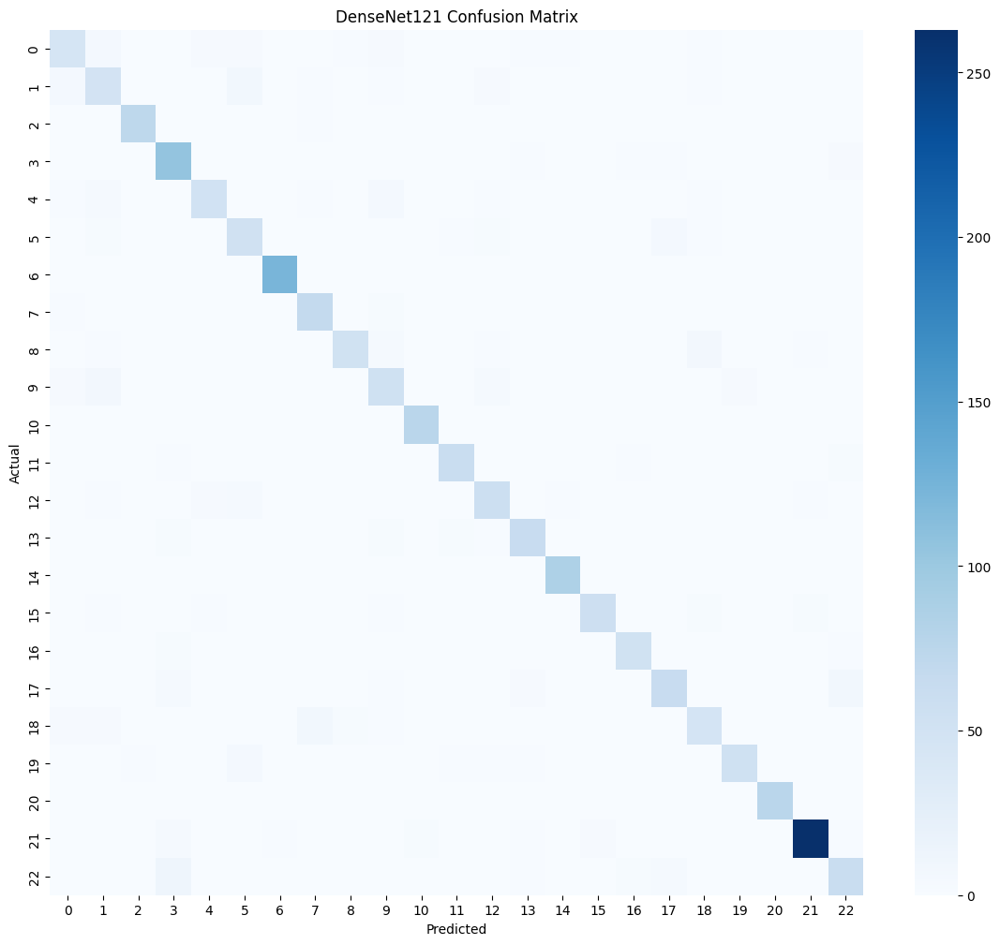

In [172]:
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(14,12))

sns.heatmap(
    cm,
    cmap='Blues'
)

plt.title("DenseNet121 Confusion Matrix")

plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.show()

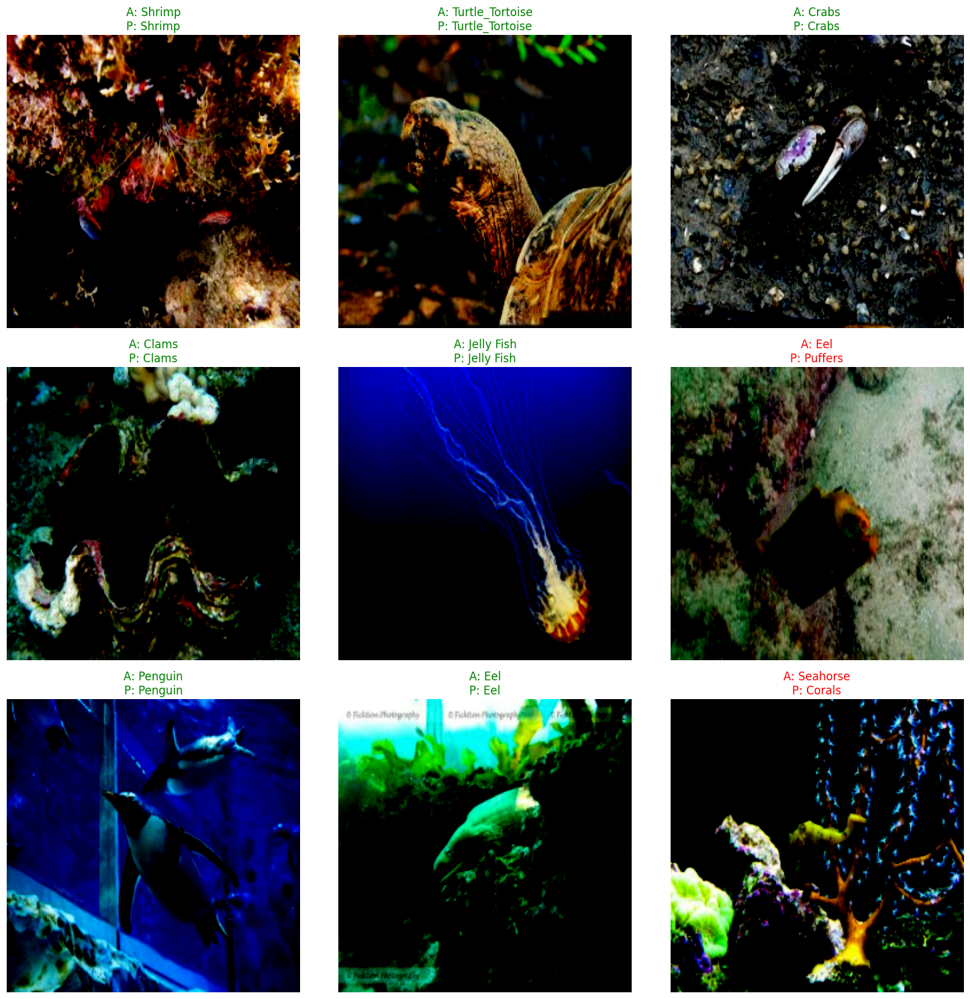

In [41]:
plt.figure(figsize=(15,15))

for images, labels in test_ds.shuffle(2000).take(1):

    preds = model.predict(images, verbose=0)

    preds = np.argmax(preds, axis=1)

    for i in range(9):

        ax = plt.subplot(3,3,i+1)

        img = images[i].numpy()

        img = np.clip(img, 0, 1)

        plt.imshow(img)

        actual = class_names[labels[i]]

        predicted = class_names[preds[i]]

        color = "green" if actual == predicted else "red"

        plt.title(
            f"A: {actual}\nP: {predicted}",
            color=color
        )

        plt.axis("off")

plt.tight_layout()

plt.savefig(
    "densenet121_predictions.png",
    dpi=300,
    bbox_inches='tight'
)

plt.show()

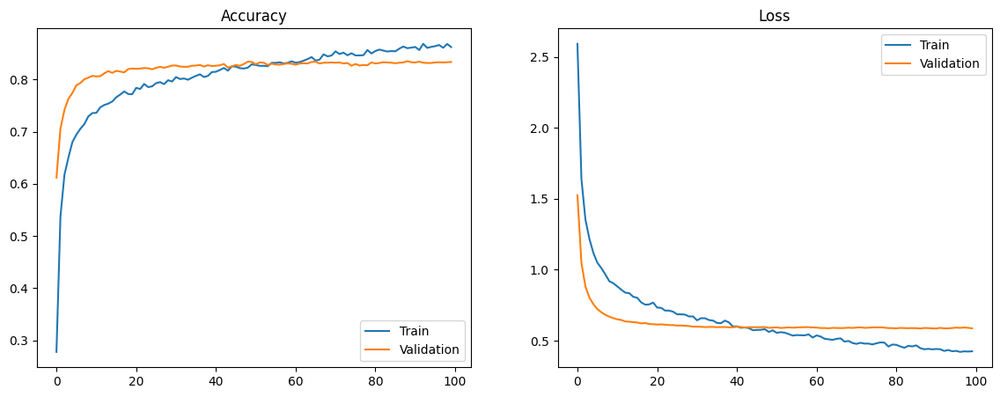

In [173]:
plt.figure(figsize=(14,5))

plt.subplot(1,2,1)

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])

plt.title("Accuracy")

plt.legend(['Train', 'Validation'])

plt.subplot(1,2,2)

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.title("Loss")

plt.legend(['Train', 'Validation'])

plt.show()

# Xception

In [17]:
from tensorflow.keras.applications import Xception
from tensorflow.keras.applications.xception import preprocess_input

In [18]:
def load_image(path, label):

    image = tf.io.read_file(path)

    image = tf.image.decode_jpeg(image, channels=3)

    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))

    image = tf.cast(image, tf.float32)

    image = preprocess_input(image)

    return image, label

In [19]:
train_ds = tf.data.Dataset.from_tensor_slices(
    (
        train_df['image'].values,
        train_df['label_encoded'].values
    )
)

valid_ds = tf.data.Dataset.from_tensor_slices(
    (
        valid_df['image'].values,
        valid_df['label_encoded'].values
    )
)

test_ds = tf.data.Dataset.from_tensor_slices(
    (
        test_df['image'].values,
        test_df['label_encoded'].values
    )
)

train_ds = (
    train_ds
    .map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
    .shuffle(1000)
    .batch(BATCH_SIZE)
    .prefetch(tf.data.AUTOTUNE)
)

valid_ds = (
    valid_ds
    .map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(tf.data.AUTOTUNE)
)

test_ds = (
    test_ds
    .map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(tf.data.AUTOTUNE)
)

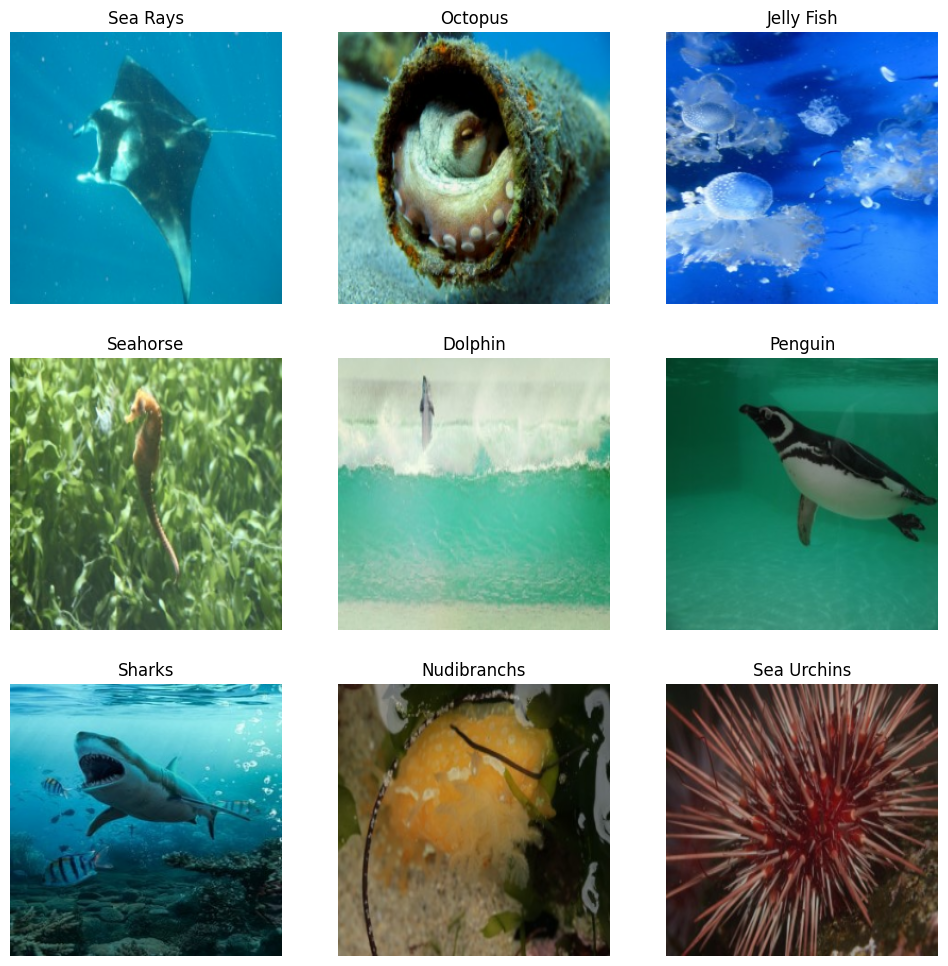

In [20]:
plt.figure(figsize=(12,12))

for images, labels in train_ds.take(1):

    for i in range(9):

        ax = plt.subplot(3,3,i+1)

        img = images[i].numpy()

        img = (img + 1) / 2

        plt.imshow(img)

        plt.title(class_names[labels[i]])

        plt.axis("off")

plt.show()

In [21]:
base_model = Xception(

    weights='imagenet',

    include_top=False,

    input_shape=(IMG_SIZE, IMG_SIZE, 3)
)

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [22]:
base_model.trainable = True

for layer in base_model.layers[:-30]:

    layer.trainable = False

In [23]:
model = models.Sequential([

    data_augmentation,

    base_model,

    layers.GlobalAveragePooling2D(),

    layers.BatchNormalization(),

    layers.Dense(512, activation='relu'),

    layers.Dropout(0.5),

    layers.Dense(256, activation='relu'),

    layers.Dropout(0.3),

    layers.Dense(num_classes, activation='softmax')

])

model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ xception (Functional)           │ (None, 8, 8, 2048)     │    20,861,480 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ ?                      │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,861,480 (79.58 MB)

 Trainable params: 8,940,352 (34.10 MB)

 Non-trainable params: 11,921,128 (45.48 MB)

In [24]:
model.compile(

    optimizer=tf.keras.optimizers.Adam(
        learning_rate=1e-4
    ),

    loss='sparse_categorical_crossentropy',

    metrics=['accuracy']
)

In [25]:
from sklearn.utils.class_weight import compute_class_weight

class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_df['label_encoded']),
    y=train_df['label_encoded']
)

class_weights = dict(enumerate(class_weights))

print(class_weights)

{0: np.float64(1.199025487256372), 1: np.float64(1.1921739130434783), 2: np.float64(1.195589884141024), 3: np.float64(0.7628169461886972), 4: np.float64(1.199025487256372), 5: np.float64(1.2059562704197035), 6: np.float64(0.7048325499412456), 7: np.float64(1.195589884141024), 8: np.float64(1.1921739130434783), 9: np.float64(1.0617324925323597), 10: np.float64(1.1921739130434783), 11: np.float64(1.2381628177009418), 12: np.float64(1.1216690042075736), 13: np.float64(1.1526543358155177), 14: np.float64(1.0302737520128824), 15: np.float64(1.245554834523037), 16: np.float64(1.4388305847076461), 17: np.float64(1.0103168754605747), 18: np.float64(1.2200610221205186), 19: np.float64(1.2344996140982762), 20: np.float64(1.195589884141024), 21: np.float64(0.31325891108499804), 22: np.float64(1.0431521739130434)}


In [26]:
history = model.fit(

    train_ds,

    validation_data=valid_ds,

    epochs=EPOCHS,

    class_weight=class_weights
)

Epoch 1/100


I0000 00:00:1779686463.429177     132 cuda_dnn.cc:529] Loaded cuDNN version 91002


300/300 ━━━━━━━━━━━━━━━━━━━━ 139s 402ms/step - accuracy: 0.3686 - loss: 2.4764 - val_accuracy: 0.7900 - val_loss: 0.8690
Epoch 2/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 119s 393ms/step - accuracy: 0.7225 - loss: 1.0246 - val_accuracy: 0.8192 - val_loss: 0.6390
Epoch 3/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 119s 393ms/step - accuracy: 0.7841 - loss: 0.7845 - val_accuracy: 0.8396 - val_loss: 0.5814
Epoch 4/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 118s 392ms/step - accuracy: 0.8292 - loss: 0.6348 - val_accuracy: 0.8571 - val_loss: 0.5512
Epoch 5/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 119s 393ms/step - accuracy: 0.8533 - loss: 0.5321 - val_accuracy: 0.8576 - val_loss: 0.5424
Epoch 6/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 119s 394ms/step - accuracy: 0.8801 - loss: 0.4255 - val_accuracy: 0.8571 - val_loss: 0.5806
Epoch 7/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 119s 394ms/step - accuracy: 0.8944 - loss: 0.3724 - val_accuracy: 0.8580 - val_loss: 0.5923
Epoch 8/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 119s 392ms/step - accuracy: 0.9106 - los

In [29]:
model.save("/kaggle/working/xception_final.keras")

print("Xception Model Saved")

Xception Model Saved


In [30]:
results = model.evaluate(test_ds)

print(results)

65/65 ━━━━━━━━━━━━━━━━━━━━ 17s 252ms/step - accuracy: 0.8432 - loss: 1.3218
[1.2426913976669312, 0.8478366732597351]


In [31]:
y_true = []
y_pred = []

for images, labels in test_ds:

    preds = model.predict(images)

    preds = np.argmax(preds, axis=1)

    y_true.extend(labels.numpy())
    y_pred.extend(preds)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

In [32]:
accuracy = accuracy_score(y_true, y_pred)

precision = precision_score(
    y_true,
    y_pred,
    average='weighted'
)

recall = recall_score(
    y_true,
    y_pred,
    average='weighted'
)

f1 = f1_score(
    y_true,
    y_pred,
    average='weighted'
)

print("\nXCEPTION FINAL RESULTS")

print("Accuracy :", accuracy)
print("Precision:", precision)
print("Recall   :", recall)
print("F1 Score :", f1)


XCEPTION FINAL RESULTS
Accuracy : 0.8478366553232863
Precision: 0.8522743331122169
Recall   : 0.8478366553232863
F1 Score : 0.847739393242066


In [33]:
print(classification_report(
    y_true,
    y_pred,
    target_names=class_names
))

                 precision    recall  f1-score   support

          Clams       0.84      0.58      0.69        74
         Corals       0.61      0.76      0.68        75
          Crabs       0.96      0.97      0.97        75
        Dolphin       0.88      0.82      0.85       118
            Eel       0.78      0.73      0.76        74
           Fish       0.71      0.74      0.72        74
     Jelly Fish       0.94      0.98      0.96       127
        Lobster       0.82      0.84      0.83        75
    Nudibranchs       0.79      0.72      0.76        75
        Octopus       0.68      0.75      0.72        85
          Otter       1.00      1.00      1.00        75
        Penguin       0.88      0.93      0.91        72
        Puffers       0.81      0.79      0.80        80
       Sea Rays       0.72      0.82      0.77        78
    Sea Urchins       0.98      0.95      0.97        87
       Seahorse       0.86      0.90      0.88        71
           Seal       0.94    

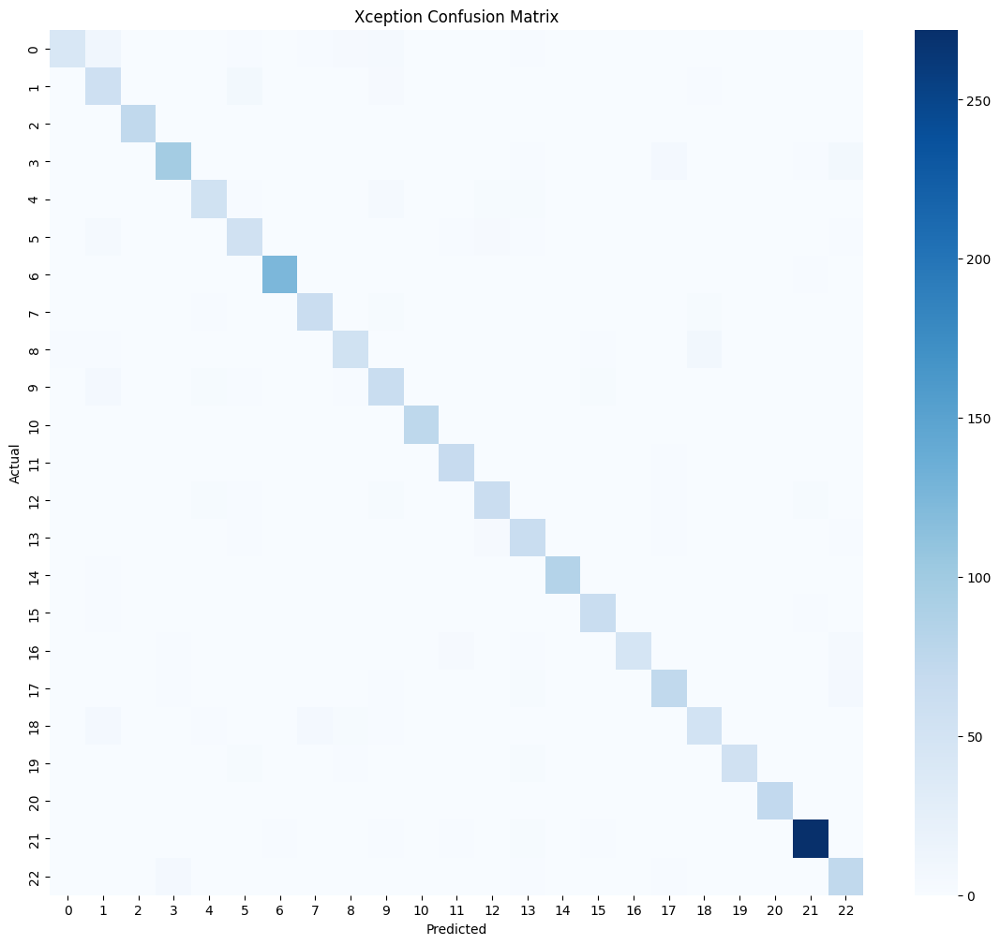

In [34]:
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(14,12))

sns.heatmap(
    cm,
    cmap='Blues'
)

plt.title("Xception Confusion Matrix")

plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.show()

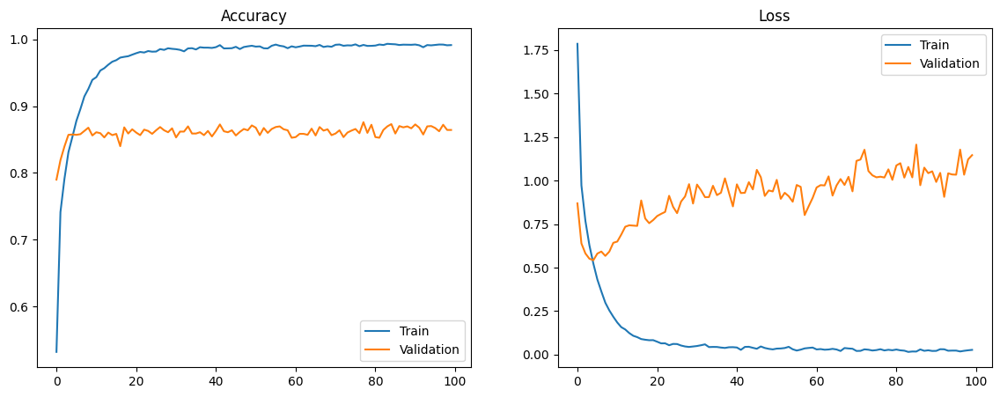

In [35]:
plt.figure(figsize=(14,5))

plt.subplot(1,2,1)

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])

plt.title("Accuracy")

plt.legend(['Train', 'Validation'])

plt.subplot(1,2,2)

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.title("Loss")

plt.legend(['Train', 'Validation'])

plt.show()

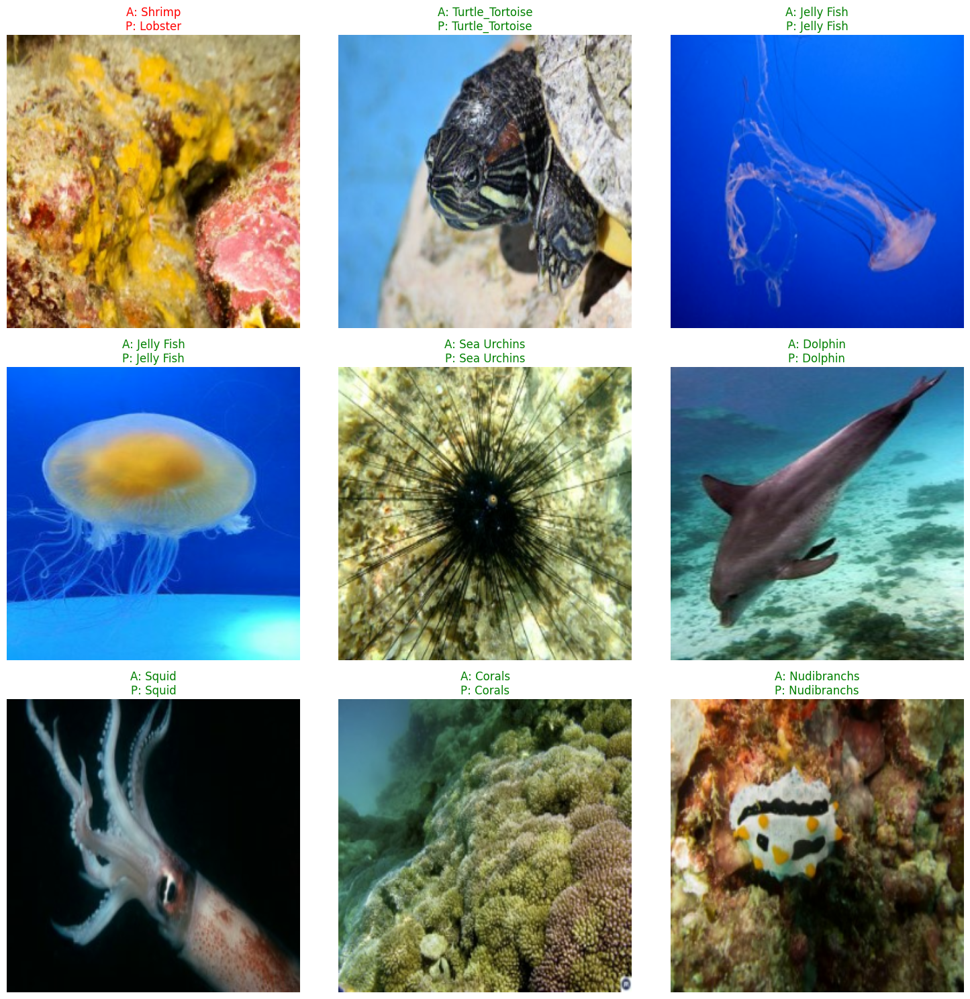

In [42]:
plt.figure(figsize=(15,15))

for images, labels in test_ds.shuffle(3000).take(1):

    preds = model.predict(images, verbose=0)

    preds = np.argmax(preds, axis=1)

    for i in range(9):

        ax = plt.subplot(3,3,i+1)

        img = images[i].numpy()

        img = (img + 1) / 2

        img = np.clip(img, 0, 1)

        plt.imshow(img)

        actual = class_names[labels[i]]

        predicted = class_names[preds[i]]

        color = "green" if actual == predicted else "red"

        plt.title(
            f"A: {actual}\nP: {predicted}",
            color=color
        )

        plt.axis("off")

plt.tight_layout()

plt.savefig(
    "xception_predictions.png",
    dpi=300,
    bbox_inches='tight'
)

plt.show()

# ResNet50V2

In [37]:
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.applications.resnet_v2 import preprocess_input

In [46]:
def load_image(path, label):

    image = tf.io.read_file(path)

    image = tf.image.decode_jpeg(image, channels=3)

    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))

    image = tf.cast(image, tf.float32)

    image = preprocess_input(image)

    return image, label

In [47]:
train_ds = tf.data.Dataset.from_tensor_slices(
    (
        train_df['image'].values,
        train_df['label_encoded'].values
    )
)

valid_ds = tf.data.Dataset.from_tensor_slices(
    (
        valid_df['image'].values,
        valid_df['label_encoded'].values
    )
)

test_ds = tf.data.Dataset.from_tensor_slices(
    (
        test_df['image'].values,
        test_df['label_encoded'].values
    )
)

train_ds = (
    train_ds
    .map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
    .shuffle(1000)
    .batch(BATCH_SIZE)
    .prefetch(tf.data.AUTOTUNE)
)

valid_ds = (
    valid_ds
    .map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(tf.data.AUTOTUNE)
)

test_ds = (
    test_ds
    .map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(tf.data.AUTOTUNE)
)

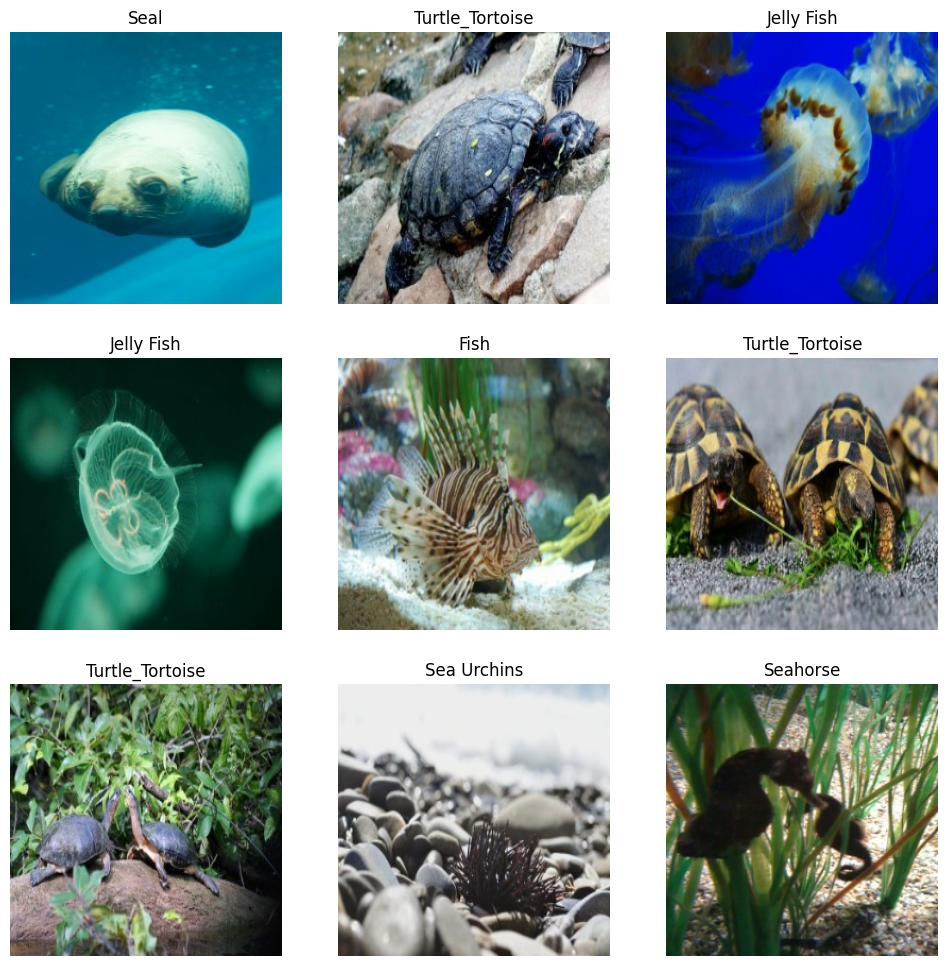

In [48]:
plt.figure(figsize=(12,12))

for images, labels in train_ds.take(1):

    for i in range(9):

        ax = plt.subplot(3,3,i+1)

        img = images[i].numpy()

        img = (img + 1) / 2

        plt.imshow(img)

        plt.title(class_names[labels[i]])

        plt.axis("off")

plt.show()

In [49]:
base_model = ResNet50V2(

    weights='imagenet',

    include_top=False,

    input_shape=(IMG_SIZE, IMG_SIZE, 3)
)

In [50]:
base_model.trainable = True

for layer in base_model.layers[:-30]:

    layer.trainable = False

In [51]:
model = models.Sequential([

    data_augmentation,

    base_model,

    layers.GlobalAveragePooling2D(),

    layers.BatchNormalization(),

    layers.Dense(512, activation='relu'),

    layers.Dropout(0.5),

    layers.Dense(256, activation='relu'),

    layers.Dropout(0.3),

    layers.Dense(num_classes, activation='softmax')

])

model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50v2 (Functional)         │ (None, 8, 8, 2048)     │    23,564,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 2048)           │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 512)            │     1,049,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 23)             │         5,911 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,759,319 (94.45 MB)

 Trainable params: 15,633,943 (59.64 MB)

 Non-trainable params: 9,125,376 (34.81 MB)

In [52]:
model.compile(

    optimizer=tf.keras.optimizers.Adam(
        learning_rate=1e-4
    ),

    loss='sparse_categorical_crossentropy',

    metrics=['accuracy']
)

In [53]:
from sklearn.utils.class_weight import compute_class_weight

class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_df['label_encoded']),
    y=train_df['label_encoded']
)

class_weights = dict(enumerate(class_weights))

print(class_weights)

{0: np.float64(1.199025487256372), 1: np.float64(1.1921739130434783), 2: np.float64(1.195589884141024), 3: np.float64(0.7628169461886972), 4: np.float64(1.199025487256372), 5: np.float64(1.2059562704197035), 6: np.float64(0.7048325499412456), 7: np.float64(1.195589884141024), 8: np.float64(1.1921739130434783), 9: np.float64(1.0617324925323597), 10: np.float64(1.1921739130434783), 11: np.float64(1.2381628177009418), 12: np.float64(1.1216690042075736), 13: np.float64(1.1526543358155177), 14: np.float64(1.0302737520128824), 15: np.float64(1.245554834523037), 16: np.float64(1.4388305847076461), 17: np.float64(1.0103168754605747), 18: np.float64(1.2200610221205186), 19: np.float64(1.2344996140982762), 20: np.float64(1.195589884141024), 21: np.float64(0.31325891108499804), 22: np.float64(1.0431521739130434)}


In [55]:
history = model.fit(

    train_ds,

    validation_data=valid_ds,

    epochs=EPOCHS,

    class_weight=class_weights
)

Epoch 1/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 88s 250ms/step - accuracy: 0.3132 - loss: 2.6372 - val_accuracy: 0.7691 - val_loss: 0.8354
Epoch 2/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 71s 234ms/step - accuracy: 0.6963 - loss: 1.0888 - val_accuracy: 0.8007 - val_loss: 0.7184
Epoch 3/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 71s 232ms/step - accuracy: 0.7792 - loss: 0.7816 - val_accuracy: 0.8177 - val_loss: 0.6577
Epoch 4/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 70s 232ms/step - accuracy: 0.8298 - loss: 0.6153 - val_accuracy: 0.8333 - val_loss: 0.6712
Epoch 5/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 71s 233ms/step - accuracy: 0.8653 - loss: 0.4794 - val_accuracy: 0.8269 - val_loss: 0.6759
Epoch 6/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 70s 232ms/step - accuracy: 0.8836 - loss: 0.3952 - val_accuracy: 0.8294 - val_loss: 0.7384
Epoch 7/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 70s 232ms/step - accuracy: 0.9064 - loss: 0.3267 - val_accuracy: 0.8308 - val_loss: 0.7049
Epoch 8/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 71s 233ms/step - accuracy: 0.9185 -

In [56]:
model.save("/kaggle/working/resnet50v2_final.keras")
 
print("ResNet50V2 Model Saved")

ResNet50V2 Model Saved


In [57]:
results = model.evaluate(test_ds)

print(results)

65/65 ━━━━━━━━━━━━━━━━━━━━ 9s 134ms/step - accuracy: 0.8261 - loss: 1.3542
[1.2782038450241089, 0.8303354382514954]


In [58]:
y_true = []
y_pred = []

for images, labels in test_ds:

    preds = model.predict(images)

    preds = np.argmax(preds, axis=1)

    y_true.extend(labels.numpy())
    y_pred.extend(preds)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

In [59]:
accuracy = accuracy_score(y_true, y_pred)

precision = precision_score(
    y_true,
    y_pred,
    average='weighted'
)

recall = recall_score(
    y_true,
    y_pred,
    average='weighted'
)

f1 = f1_score(
    y_true,
    y_pred,
    average='weighted'
)

print("\nRESNET50V2 FINAL RESULTS")

print("Accuracy :", accuracy)
print("Precision:", precision)
print("Recall   :", recall)
print("F1 Score :", f1)


RESNET50V2 FINAL RESULTS
Accuracy : 0.8303354399611084
Precision: 0.8334806981965961
Recall   : 0.8303354399611084
F1 Score : 0.8294339056183064


In [60]:
print(classification_report(
    y_true,
    y_pred,
    target_names=class_names
))

                 precision    recall  f1-score   support

          Clams       0.89      0.64      0.74        74
         Corals       0.63      0.68      0.65        75
          Crabs       0.92      0.95      0.93        75
        Dolphin       0.86      0.86      0.86       118
            Eel       0.69      0.70      0.70        74
           Fish       0.65      0.78      0.71        74
     Jelly Fish       0.91      0.96      0.93       127
        Lobster       0.84      0.76      0.80        75
    Nudibranchs       0.81      0.68      0.74        75
        Octopus       0.69      0.68      0.69        85
          Otter       1.00      1.00      1.00        75
        Penguin       0.84      0.89      0.86        72
        Puffers       0.77      0.72      0.75        80
       Sea Rays       0.74      0.82      0.78        78
    Sea Urchins       0.95      1.00      0.97        87
       Seahorse       0.87      0.85      0.86        71
           Seal       0.88    

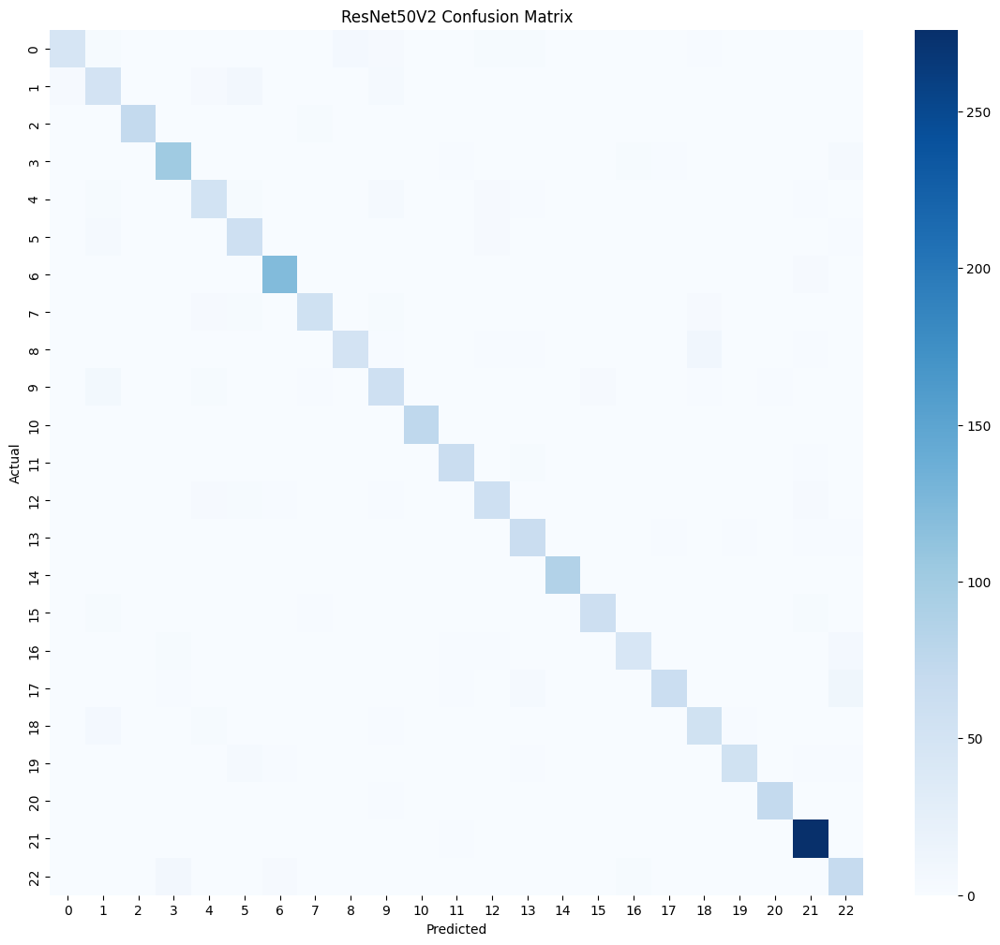

In [61]:
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(14,12))

sns.heatmap(
    cm,
    cmap='Blues'
)

plt.title("ResNet50V2 Confusion Matrix")

plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.show()

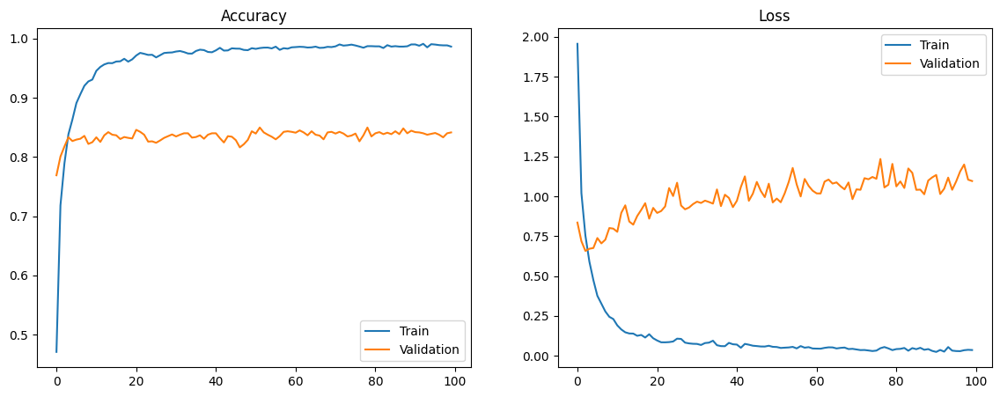

In [62]:
plt.figure(figsize=(14,5))

plt.subplot(1,2,1)

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])

plt.title("Accuracy")

plt.legend(['Train', 'Validation'])

plt.subplot(1,2,2)

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.title("Loss")

plt.legend(['Train', 'Validation'])

plt.show()

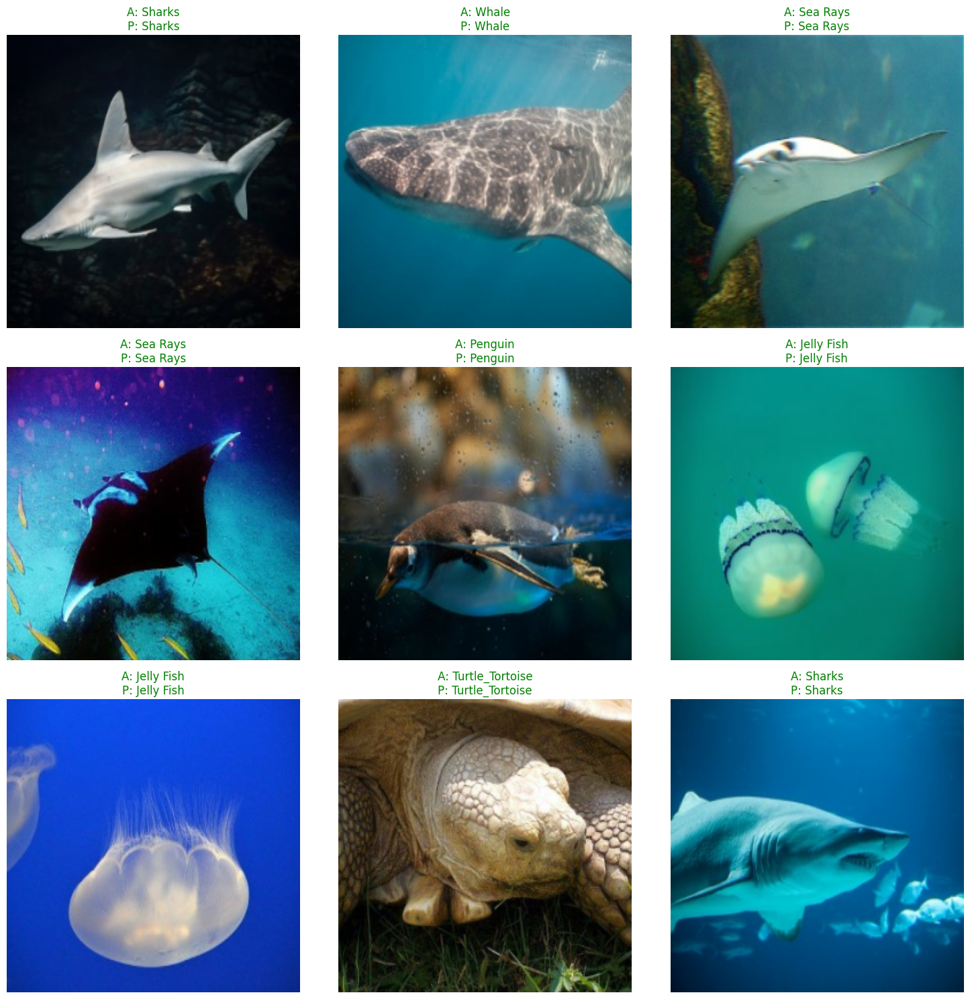

In [43]:
plt.figure(figsize=(15,15))

for images, labels in test_ds.shuffle(4000).take(1):

    preds = model.predict(images, verbose=0)

    preds = np.argmax(preds, axis=1)

    for i in range(9):

        ax = plt.subplot(3,3,i+1)

        img = images[i].numpy()

        img = (img + 1) / 2

        img = np.clip(img, 0, 1)

        plt.imshow(img)

        actual = class_names[labels[i]]

        predicted = class_names[preds[i]]

        color = "green" if actual == predicted else "red"

        plt.title(
            f"A: {actual}\nP: {predicted}",
            color=color
        )

        plt.axis("off")

plt.tight_layout()

plt.savefig(
    "resnet50v2_predictions.png",
    dpi=300,
    bbox_inches='tight'
)

plt.show()

# NASNetMobile

In [14]:
from tensorflow.keras.applications import NASNetMobile
from tensorflow.keras.applications.nasnet import preprocess_input

In [15]:
def load_image(path, label):

    image = tf.io.read_file(path)

    image = tf.image.decode_jpeg(image, channels=3)

    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))

    image = tf.cast(image, tf.float32)

    image = preprocess_input(image)

    return image, label

In [16]:
train_ds = tf.data.Dataset.from_tensor_slices(
    (
        train_df['image'].values,
        train_df['label_encoded'].values
    )
)

valid_ds = tf.data.Dataset.from_tensor_slices(
    (
        valid_df['image'].values,
        valid_df['label_encoded'].values
    )
)

test_ds = tf.data.Dataset.from_tensor_slices(
    (
        test_df['image'].values,
        test_df['label_encoded'].values
    )
)

train_ds = (
    train_ds
    .map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
    .shuffle(1000)
    .batch(BATCH_SIZE)
    .prefetch(tf.data.AUTOTUNE)
)

valid_ds = (
    valid_ds
    .map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(tf.data.AUTOTUNE)
)

test_ds = (
    test_ds
    .map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(tf.data.AUTOTUNE)
)

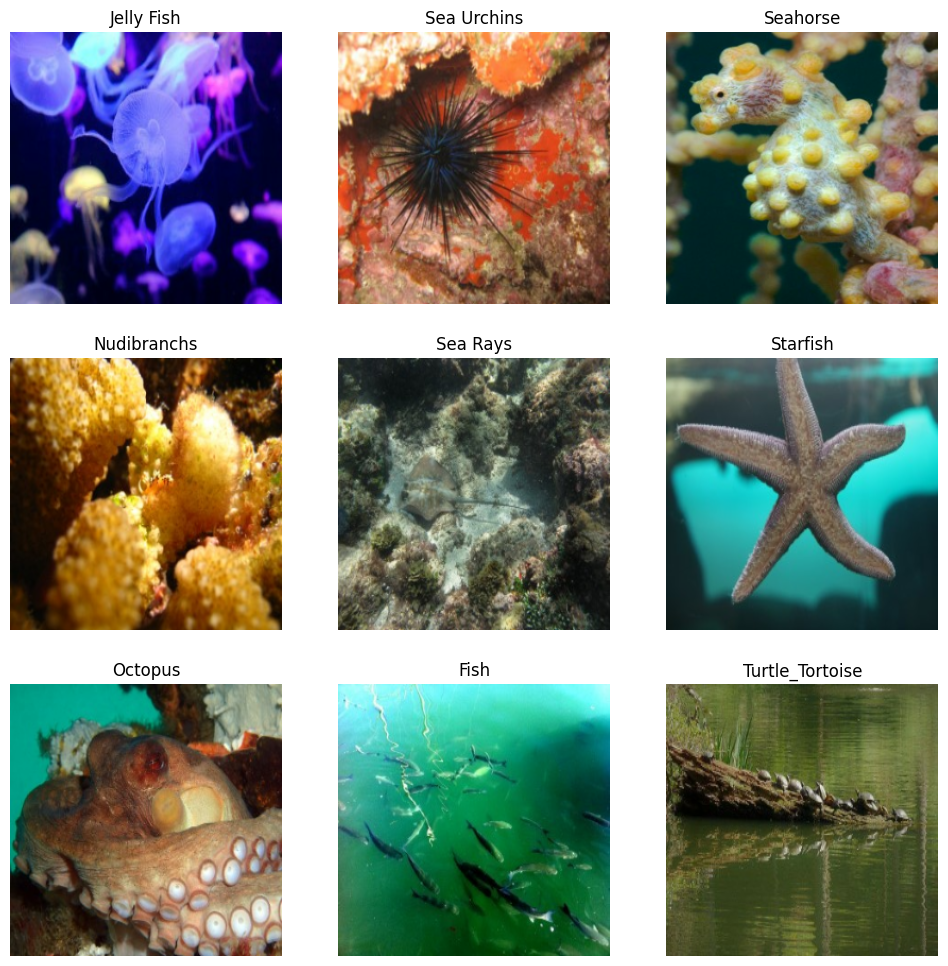

In [17]:
plt.figure(figsize=(12,12))

for images, labels in train_ds.take(1):

    for i in range(9):

        ax = plt.subplot(3,3,i+1)

        img = images[i].numpy()

        img = (img + 1) / 2

        plt.imshow(img)

        plt.title(class_names[labels[i]])

        plt.axis("off")

plt.show()

In [18]:
base_model = NASNetMobile(

    weights='imagenet',

    include_top=False,

    input_shape=(IMG_SIZE, IMG_SIZE, 3)
)

19993432/19993432 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [19]:
base_model.trainable = True

for layer in base_model.layers[:-25]:

    layer.trainable = False

In [20]:
model = models.Sequential([

    data_augmentation,

    base_model,

    layers.GlobalAveragePooling2D(),

    layers.BatchNormalization(),

    layers.Dense(512, activation='relu'),

    layers.Dropout(0.5),

    layers.Dense(256, activation='relu'),

    layers.Dropout(0.3),

    layers.Dense(num_classes, activation='softmax')

])

model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ nasnet_mobile (Functional)      │ (None, 8, 8, 1056)     │     4,269,716 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ ?                      │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,269,716 (16.29 MB)

 Trainable params: 170,192 (664.81 KB)

 Non-trainable params: 4,099,524 (15.64 MB)

In [21]:
model.compile(

    optimizer=tf.keras.optimizers.Adam(
        learning_rate=1e-4
    ),

    loss='sparse_categorical_crossentropy',

    metrics=['accuracy']
)

In [22]:
from sklearn.utils.class_weight import compute_class_weight

class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_df['label_encoded']),
    y=train_df['label_encoded']
)

class_weights = dict(enumerate(class_weights))

print(class_weights)

{0: np.float64(1.199025487256372), 1: np.float64(1.1921739130434783), 2: np.float64(1.195589884141024), 3: np.float64(0.7628169461886972), 4: np.float64(1.199025487256372), 5: np.float64(1.2059562704197035), 6: np.float64(0.7048325499412456), 7: np.float64(1.195589884141024), 8: np.float64(1.1921739130434783), 9: np.float64(1.0617324925323597), 10: np.float64(1.1921739130434783), 11: np.float64(1.2381628177009418), 12: np.float64(1.1216690042075736), 13: np.float64(1.1526543358155177), 14: np.float64(1.0302737520128824), 15: np.float64(1.245554834523037), 16: np.float64(1.4388305847076461), 17: np.float64(1.0103168754605747), 18: np.float64(1.2200610221205186), 19: np.float64(1.2344996140982762), 20: np.float64(1.195589884141024), 21: np.float64(0.31325891108499804), 22: np.float64(1.0431521739130434)}


In [23]:
history = model.fit(

    train_ds,

    validation_data=valid_ds,

    epochs=EPOCHS,

    class_weight=class_weights
)

Epoch 1/100


I0000 00:00:1779772043.006595     164 cuda_dnn.cc:529] Loaded cuDNN version 91002


300/300 ━━━━━━━━━━━━━━━━━━━━ 71s 148ms/step - accuracy: 0.3200 - loss: 2.6280 - val_accuracy: 0.7404 - val_loss: 0.9631
Epoch 2/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - accuracy: 0.6497 - loss: 1.2950 - val_accuracy: 0.7598 - val_loss: 0.7935
Epoch 3/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - accuracy: 0.6909 - loss: 1.1138 - val_accuracy: 0.7749 - val_loss: 0.7481
Epoch 4/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - accuracy: 0.7131 - loss: 1.0342 - val_accuracy: 0.7885 - val_loss: 0.7206
Epoch 5/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 39s 128ms/step - accuracy: 0.7266 - loss: 0.9818 - val_accuracy: 0.7939 - val_loss: 0.6976
Epoch 6/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 39s 128ms/step - accuracy: 0.7387 - loss: 0.9549 - val_accuracy: 0.7992 - val_loss: 0.6809
Epoch 7/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - accuracy: 0.7507 - loss: 0.8965 - val_accuracy: 0.8051 - val_loss: 0.6693
Epoch 8/100
300/300 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - accuracy: 0.7621 - loss: 0.845

In [25]:
model.save("/kaggle/working/nasnetmobile_final.keras")

print("NASNetMobile Model Saved")

NASNetMobile Model Saved


In [26]:
y_true = []
y_pred = []

for images, labels in test_ds:

    preds = model.predict(images)

    preds = np.argmax(preds, axis=1)

    y_true.extend(labels.numpy())
    y_pred.extend(preds)

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

In [27]:
accuracy = accuracy_score(y_true, y_pred)

precision = precision_score(
    y_true,
    y_pred,
    average='weighted'
)

recall = recall_score(
    y_true,
    y_pred,
    average='weighted'
)

f1 = f1_score(
    y_true,
    y_pred,
    average='weighted'
)

print("\nNASNETMOBILE FINAL RESULTS")

print("Accuracy :", accuracy)
print("Precision:", precision)
print("Recall   :", recall)
print("F1 Score :", f1)


NASNETMOBILE FINAL RESULTS
Accuracy : 0.8099173553719008
Precision: 0.8138403525162496
Recall   : 0.8099173553719008
F1 Score : 0.8086290322415955


In [28]:
print(classification_report(
    y_true,
    y_pred,
    target_names=class_names
))

                 precision    recall  f1-score   support

          Clams       0.68      0.53      0.60        74
         Corals       0.59      0.77      0.67        75
          Crabs       0.97      0.96      0.97        75
        Dolphin       0.73      0.86      0.79       118
            Eel       0.69      0.80      0.74        74
           Fish       0.72      0.69      0.70        74
     Jelly Fish       0.97      0.98      0.98       127
        Lobster       0.73      0.83      0.78        75
    Nudibranchs       0.74      0.73      0.74        75
        Octopus       0.65      0.58      0.61        85
          Otter       0.99      1.00      0.99        75
        Penguin       0.83      0.88      0.85        72
        Puffers       0.85      0.80      0.83        80
       Sea Rays       0.69      0.82      0.75        78
    Sea Urchins       0.97      0.99      0.98        87
       Seahorse       0.75      0.73      0.74        71
           Seal       0.85    

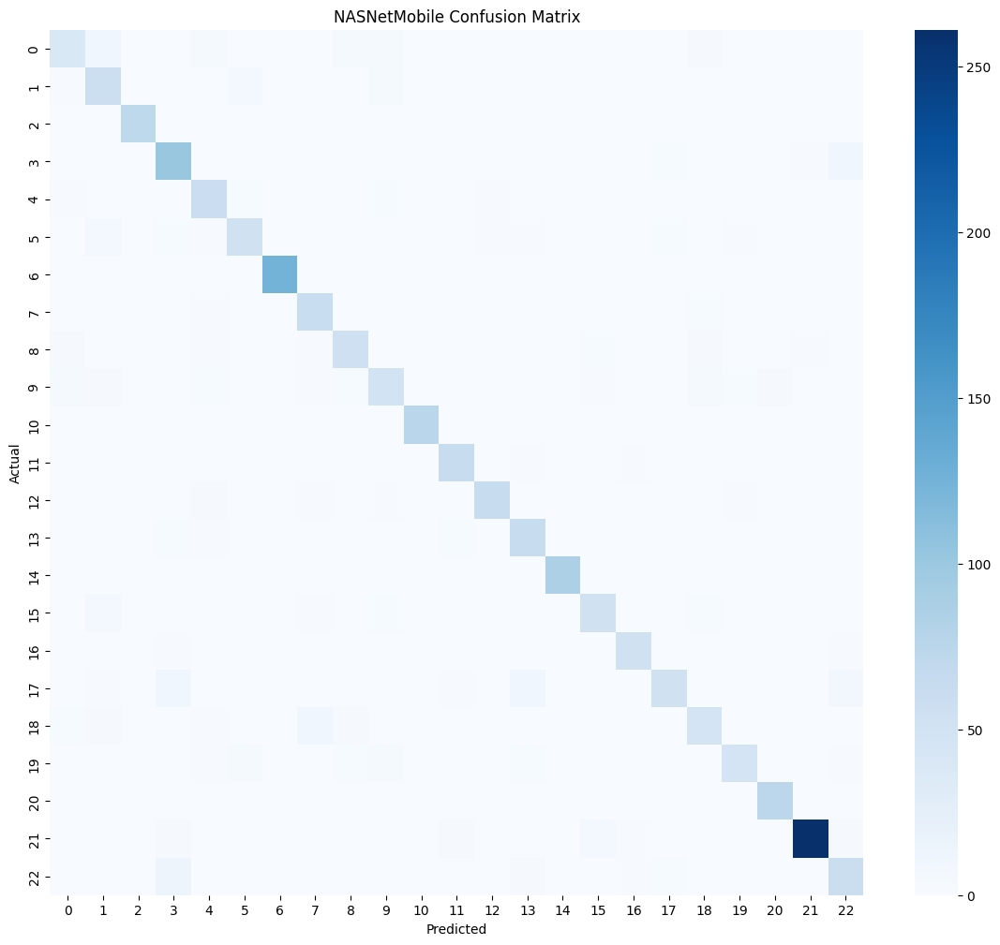

In [29]:
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(14,12))

sns.heatmap(
    cm,
    cmap='Blues'
)

plt.title("NASNetMobile Confusion Matrix")

plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.show()

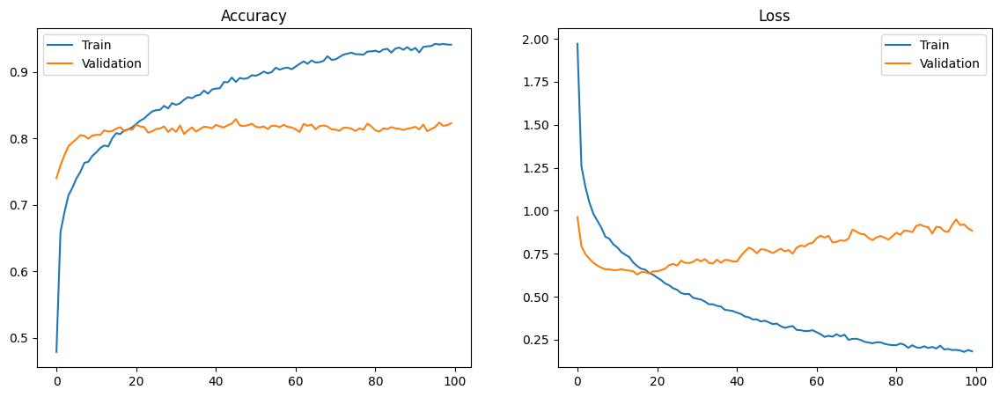

In [30]:
plt.figure(figsize=(14,5))

plt.subplot(1,2,1)

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])

plt.title("Accuracy")

plt.legend(['Train', 'Validation'])

plt.subplot(1,2,2)

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.title("Loss")

plt.legend(['Train', 'Validation'])

plt.show()

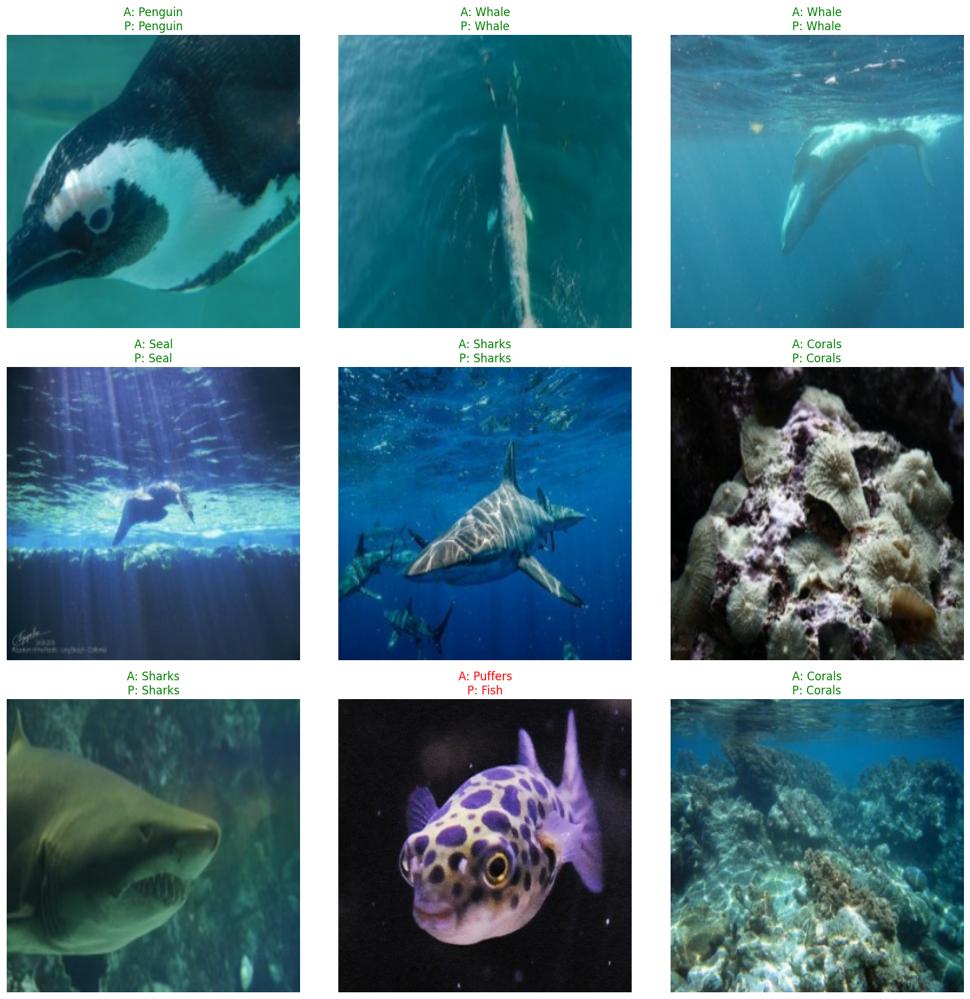

In [44]:
plt.figure(figsize=(15,15))

for images, labels in test_ds.shuffle(5000).take(1):

    preds = model.predict(images, verbose=0)

    preds = np.argmax(preds, axis=1)

    for i in range(9):

        ax = plt.subplot(3,3,i+1)

        img = images[i].numpy()

        img = (img + 1) / 2

        img = np.clip(img, 0, 1)

        plt.imshow(img)

        actual = class_names[labels[i]]

        predicted = class_names[preds[i]]

        color = "green" if actual == predicted else "red"

        plt.title(
            f"A: {actual}\nP: {predicted}",
            color=color
        )

        plt.axis("off")

plt.tight_layout()

plt.savefig(
    "nasnetmobile_predictions.png",
    dpi=300,
    bbox_inches='tight'
)

plt.show()

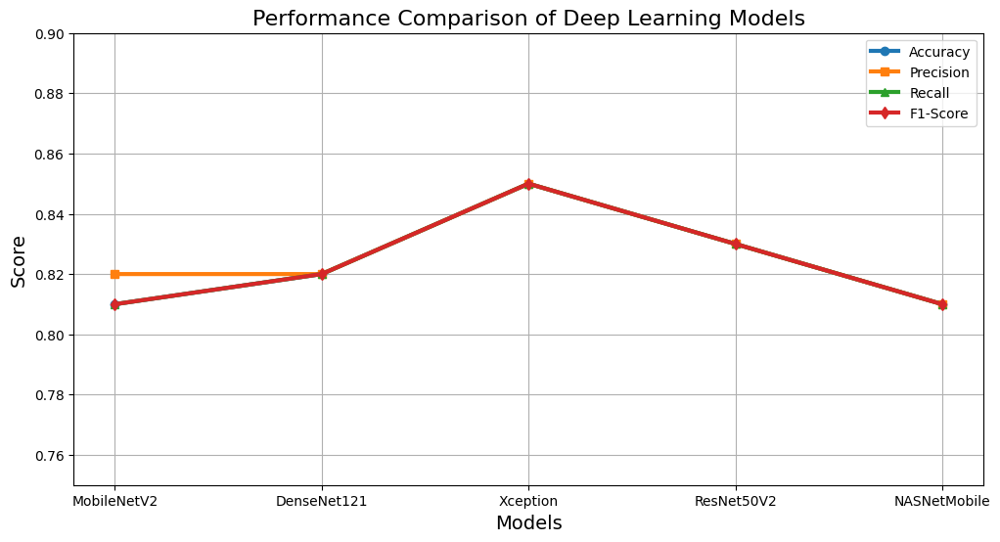

In [45]:
import matplotlib.pyplot as plt

# Model Names
models = [
    'MobileNetV2',
    'DenseNet121',
    'Xception',
    'ResNet50V2',
    'NASNetMobile'
]

# Metrics
accuracy = [0.81, 0.82, 0.85, 0.83, 0.81]
precision = [0.82, 0.82, 0.85, 0.83, 0.81]
recall = [0.81, 0.82, 0.85, 0.83, 0.81]
f1_score = [0.81, 0.82, 0.85, 0.83, 0.81]

# Create Figure
plt.figure(figsize=(12,6))

# Plot Lines
plt.plot(models, accuracy, marker='o', linewidth=3, label='Accuracy')
plt.plot(models, precision, marker='s', linewidth=3, label='Precision')
plt.plot(models, recall, marker='^', linewidth=3, label='Recall')
plt.plot(models, f1_score, marker='d', linewidth=3, label='F1-Score')

# Labels and Title
plt.title('Performance Comparison of Deep Learning Models', fontsize=16)
plt.xlabel('Models', fontsize=14)
plt.ylabel('Score', fontsize=14)

# Axis Limits
plt.ylim(0.75, 0.90)

# Grid
plt.grid(True)

# Legend
plt.legend()

# Save Graph
plt.savefig(
    'model_performance_comparison.png',
    dpi=300,
    bbox_inches='tight'
)

# Show Graph
plt.show()

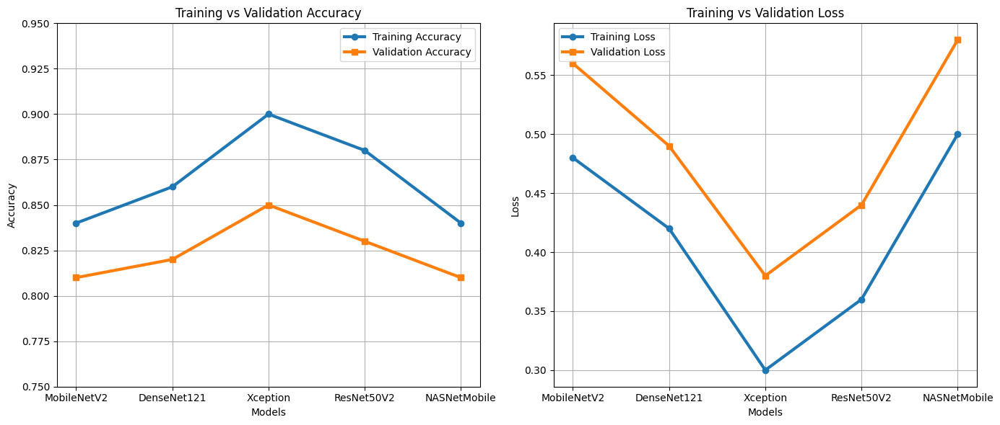

In [47]:
import matplotlib.pyplot as plt

# Model Names
models = [
    'MobileNetV2',
    'DenseNet121',
    'Xception',
    'ResNet50V2',
    'NASNetMobile'
]

# Training Accuracy
train_accuracy = [0.84, 0.86, 0.90, 0.88, 0.84]

# Validation Accuracy
val_accuracy = [0.81, 0.82, 0.85, 0.83, 0.81]

# Training Loss
train_loss = [0.48, 0.42, 0.30, 0.36, 0.50]

# Validation Loss
val_loss = [0.56, 0.49, 0.38, 0.44, 0.58]

# Create Figure
plt.figure(figsize=(14,6))

# ---------------- Accuracy Graph ----------------
plt.subplot(1,2,1)

plt.plot(
    models,
    train_accuracy,
    marker='o',
    linewidth=3,
    label='Training Accuracy'
)

plt.plot(
    models,
    val_accuracy,
    marker='s',
    linewidth=3,
    label='Validation Accuracy'
)

plt.title('Training vs Validation Accuracy')
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.ylim(0.75, 0.95)
plt.grid(True)
plt.legend()

# ---------------- Loss Graph ----------------
plt.subplot(1,2,2)

plt.plot(
    models,
    train_loss,
    marker='o',
    linewidth=3,
    label='Training Loss'
)

plt.plot(
    models,
    val_loss,
    marker='s',
    linewidth=3,
    label='Validation Loss'
)

plt.title('Training vs Validation Loss')
plt.xlabel('Models')
plt.ylabel('Loss')
plt.grid(True)
plt.legend()

# Layout
plt.tight_layout()

# Save Figure
plt.savefig(
    'training_validation_comparison.png',
    dpi=300,
    bbox_inches='tight'
)

# Show Figure
plt.show()

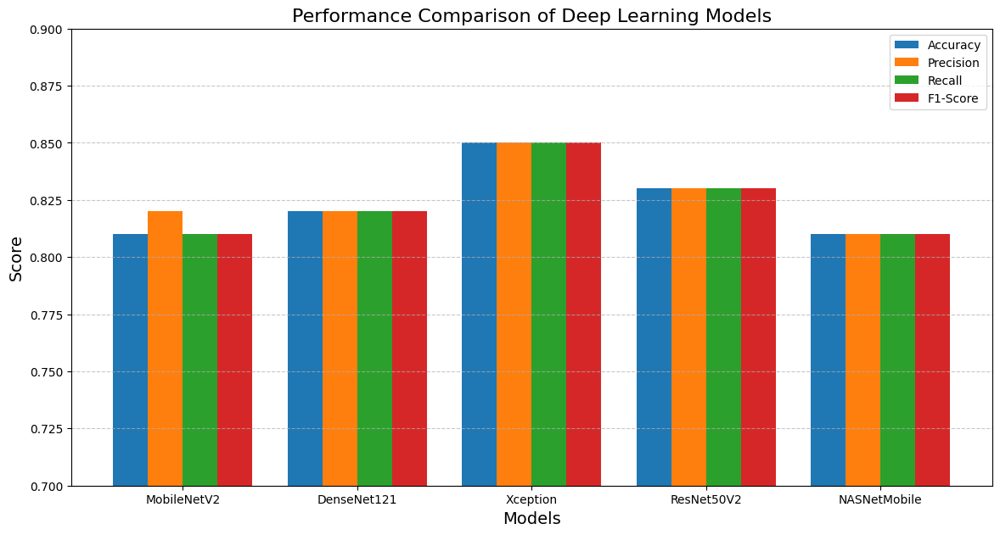

In [48]:
import matplotlib.pyplot as plt
import numpy as np

# Model Names
models = [
    'MobileNetV2',
    'DenseNet121',
    'Xception',
    'ResNet50V2',
    'NASNetMobile'
]

# Metrics
accuracy = [0.81, 0.82, 0.85, 0.83, 0.81]
precision = [0.82, 0.82, 0.85, 0.83, 0.81]
recall = [0.81, 0.82, 0.85, 0.83, 0.81]
f1_score = [0.81, 0.82, 0.85, 0.83, 0.81]

# X-axis positions
x = np.arange(len(models))

# Width of bars
width = 0.2

# Create Figure
plt.figure(figsize=(14,7))

# Create Bars
plt.bar(x - 1.5*width, accuracy, width, label='Accuracy')
plt.bar(x - 0.5*width, precision, width, label='Precision')
plt.bar(x + 0.5*width, recall, width, label='Recall')
plt.bar(x + 1.5*width, f1_score, width, label='F1-Score')

# Labels and Title
plt.xlabel('Models', fontsize=14)
plt.ylabel('Score', fontsize=14)
plt.title('Performance Comparison of Deep Learning Models', fontsize=16)

# X-axis labels
plt.xticks(x, models)

# Y-axis range
plt.ylim(0.70, 0.90)

# Grid
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Legend
plt.legend()

# Save Graph
plt.savefig(
    'performance_barchart.png',
    dpi=300,
    bbox_inches='tight'
)

# Show Graph
plt.show()